In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip "/content/drive/MyDrive/dataset.zip" -d "/content/drive/MyDrive"

Archive:  /content/drive/MyDrive/dataset.zip
  inflating: /content/drive/MyDrive/Pothole_Segmentation_YOLOv8/README.dataset.txt  
  inflating: /content/drive/MyDrive/Pothole_Segmentation_YOLOv8/README.roboflow.txt  
  inflating: /content/drive/MyDrive/Pothole_Segmentation_YOLOv8/data.yaml  
  inflating: /content/drive/MyDrive/Pothole_Segmentation_YOLOv8/sample_video.mp4  
  inflating: /content/drive/MyDrive/Pothole_Segmentation_YOLOv8/train/images/pic-1-_jpg.rf.49882cdb272111f43a6656b1494a4918.jpg  
  inflating: /content/drive/MyDrive/Pothole_Segmentation_YOLOv8/train/images/pic-1-_jpg.rf.8d95dd1d29760a2634a45cc7fdd84b31.jpg  
  inflating: /content/drive/MyDrive/Pothole_Segmentation_YOLOv8/train/images/pic-1-_jpg.rf.e238c9bf3fe82e8ac55b0014a27fc529.jpg  
  inflating: /content/drive/MyDrive/Pothole_Segmentation_YOLOv8/train/images/pic-10-_jpg.rf.1d433d21e11d000b6b498eacb88fe4a9.jpg  
  inflating: /content/drive/MyDrive/Pothole_Segmentation_YOLOv8/train/images/pic-10-_jpg.rf.500c683a687e

In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 793.7/793.7 kB 7.6 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-m

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import warnings
from ultralytics import YOLO
import cv2
from PIL import Image
import yaml
import random
from google.colab.patches import cv2_imshow

In [ ]:
dataDir = '/content/drive/MyDrive/Pothole_Segmentation_YOLOv8/'

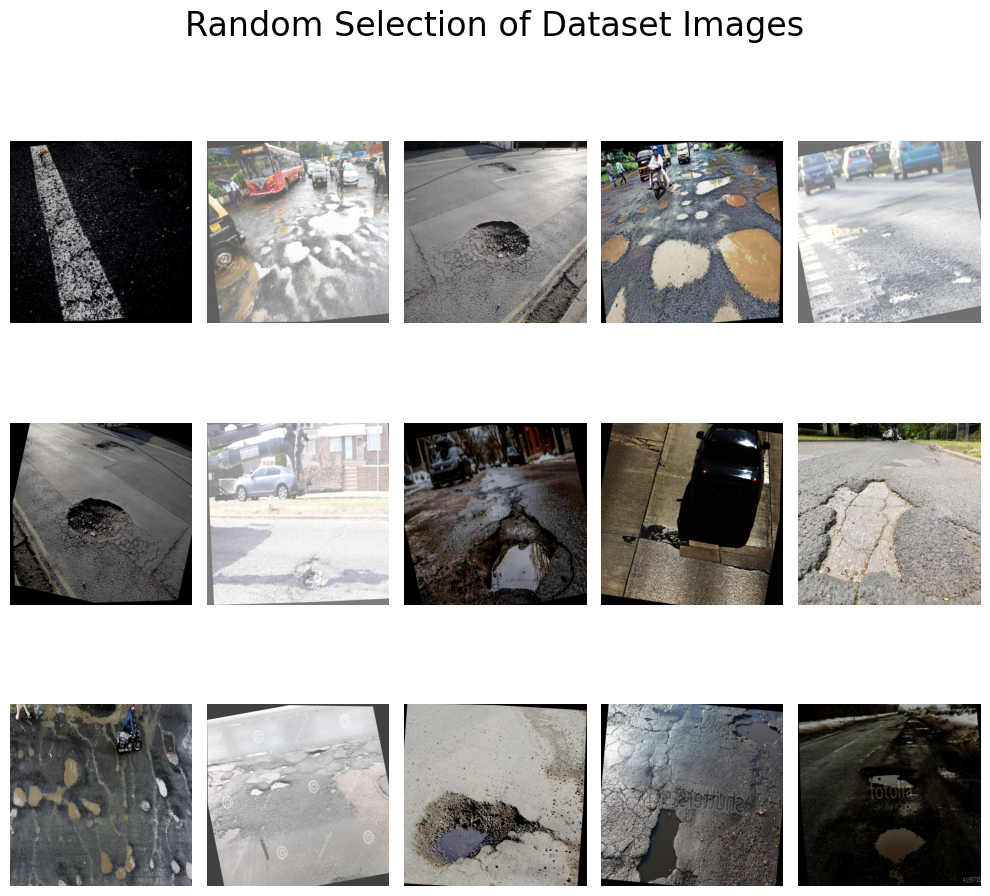

In [ ]:
trainImagePath = os.path.join(dataDir, 'train','images')

#list of the images
imageFiles = [f for f in os.listdir(trainImagePath) if f.endswith('.jpg')]

randomImages = random.sample(imageFiles, 15)

plt.figure(figsize=(10, 10))

for i, image_file in enumerate(randomImages):

    image_path = os.path.join(trainImagePath, image_file)
    image = Image.open(image_path)
    plt.subplot(3, 5, i + 1)
    plt.imshow(image)
    plt.axis('off')

plt.suptitle('Random Selection of Dataset Images', fontsize=24)

plt.tight_layout()
plt.show()

In [ ]:
model = YOLO('yolov8n-seg.pt')

100%|██████████| 6.74M/6.74M [00:00<00:00, 85.4MB/s]


In [ ]:
yamlFilePath = os.path.join(dataDir,'data.yaml' )

In [ ]:
results = model.train(
    data= yamlFilePath,
    epochs=30,
    imgsz=640,
    batch=32,
    optimizer='auto',)

Ultralytics YOLOv8.2.48 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov8n-seg.pt, data=/content/drive/MyDrive/Pothole_Segmentation_YOLOv8/data.yaml, epochs=30, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, 

100%|██████████| 755k/755k [00:00<00:00, 29.4MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 6.25M/6.25M [00:00<00:00, 105MB/s]
/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


AMP: checks passed ✅


train: Scanning /content/drive/MyDrive/Pothole_Segmentation_YOLOv8/train/labels... 720 images, 0 backgrounds, 0 corrupt: 100%|██████████| 720/720 [00:08<00:00, 80.78it/s] 


train: New cache created: /content/drive/MyDrive/Pothole_Segmentation_YOLOv8/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /content/drive/MyDrive/Pothole_Segmentation_YOLOv8/valid/labels... 60 images, 0 backgrounds, 0 corrupt: 100%|██████████| 60/60 [00:00<00:00, 65.80it/s]


val: New cache created: /content/drive/MyDrive/Pothole_Segmentation_YOLOv8/valid/labels.cache
Plotting labels to runs/segment/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/segment/train
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/30      6.16G      1.515      3.306      2.614      1.447         65        640: 100%|██████████| 23/23 [00:32<00:00,  1.43s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:04<00:00,  4.06s/it]

                   all         60        201    0.00928      0.831      0.219      0.114    0.00928      0.831      0.208     0.0866



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/30      5.41G      1.403      2.364      1.765      1.379         68        640: 100%|██████████| 23/23 [00:20<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.74s/it]

                   all         60        201      0.377      0.194      0.176     0.0764      0.428      0.169      0.156       0.06



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/30      5.41G      1.438       2.36      1.677       1.38         61        640: 100%|██████████| 23/23 [00:20<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.56s/it]

                   all         60        201      0.284      0.259      0.218       0.11      0.255      0.234      0.188      0.075



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/30      5.42G      1.434      2.307      1.556      1.371         54        640: 100%|██████████| 23/23 [00:20<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.94s/it]

                   all         60        201      0.274      0.254      0.177     0.0725      0.278      0.254      0.175     0.0646



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/30      5.43G      1.421      2.307      1.499      1.361         84        640: 100%|██████████| 23/23 [00:20<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:03<00:00,  3.04s/it]

                   all         60        201       0.28      0.261      0.171     0.0769      0.253      0.236      0.133     0.0597



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/30       5.4G      1.447      2.279      1.462      1.397         76        640: 100%|██████████| 23/23 [00:20<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]

                   all         60        201      0.398      0.428      0.344      0.144        0.3      0.357      0.228     0.0936



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/30      5.41G      1.382      2.218      1.393      1.364         74        640: 100%|██████████| 23/23 [00:20<00:00,  1.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.54s/it]

                   all         60        201      0.487      0.458      0.422      0.233      0.505      0.473      0.432      0.224



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/30      5.43G      1.365       2.13      1.314      1.338         65        640: 100%|██████████| 23/23 [00:20<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.78s/it]

                   all         60        201      0.608      0.555      0.555      0.279      0.607      0.552      0.537      0.251



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/30      5.39G      1.341      2.163      1.289      1.319         61        640: 100%|██████████| 23/23 [00:21<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.49s/it]

                   all         60        201      0.647      0.582      0.576        0.3      0.653      0.582      0.574      0.291



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/30      5.44G      1.304      2.085      1.198      1.286         71        640: 100%|██████████| 23/23 [00:20<00:00,  1.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.45s/it]

                   all         60        201      0.652      0.622      0.643      0.341      0.648      0.637      0.624      0.331



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/30      5.33G      1.308      2.102      1.173      1.288         55        640: 100%|██████████| 23/23 [00:25<00:00,  1.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]

                   all         60        201      0.591      0.345      0.394      0.179       0.51      0.343      0.368      0.168



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/30       5.6G      1.287      2.008      1.118      1.258         65        640: 100%|██████████| 23/23 [00:20<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.82s/it]

                   all         60        201      0.618      0.672      0.634       0.37      0.637      0.692      0.656       0.36



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/30      5.46G      1.226      1.953      1.076      1.235         93        640: 100%|██████████| 23/23 [00:20<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.76s/it]

                   all         60        201      0.588      0.617      0.609      0.329      0.577      0.617      0.598      0.315



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/30      5.39G      1.232      1.971      1.063      1.243         79        640: 100%|██████████| 23/23 [00:20<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]

                   all         60        201      0.669      0.522      0.588      0.314      0.647      0.522      0.575      0.287



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/30      5.51G      1.198      1.946      1.036      1.232         75        640: 100%|██████████| 23/23 [00:20<00:00,  1.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]

                   all         60        201      0.635      0.587       0.61      0.343      0.642      0.607      0.626      0.335



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/30      5.56G      1.142      1.843     0.9562      1.185         65        640: 100%|██████████| 23/23 [00:20<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.14s/it]

                   all         60        201      0.727      0.592      0.672      0.375      0.749      0.607      0.687      0.379



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/30      5.36G      1.157       1.84     0.9521      1.192         66        640: 100%|██████████| 23/23 [00:21<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.87s/it]

                   all         60        201      0.622      0.621      0.638      0.363      0.622      0.612      0.633      0.334



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/30      5.37G      1.153       1.84     0.9568       1.19         76        640: 100%|██████████| 23/23 [00:20<00:00,  1.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.64s/it]

                   all         60        201        0.7      0.592      0.676      0.393      0.716      0.615      0.693      0.374



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/30      5.39G      1.132      1.791     0.9256      1.182         90        640: 100%|██████████| 23/23 [00:21<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]

                   all         60        201      0.655      0.662      0.656      0.381      0.655      0.662       0.67      0.354



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/30      5.42G      1.102      1.778     0.8701      1.161         54        640: 100%|██████████| 23/23 [00:20<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.05s/it]

                   all         60        201      0.682      0.637      0.673      0.402      0.677      0.642      0.681      0.375


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/30      5.34G      1.103      1.713     0.8508       1.16         38        640: 100%|██████████| 23/23 [00:28<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.45s/it]

                   all         60        201      0.666      0.557      0.622      0.366      0.646      0.542      0.604      0.317



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/30      5.37G      1.082      1.702     0.8042      1.164         29        640: 100%|██████████| 23/23 [00:19<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.32s/it]

                   all         60        201      0.623      0.652      0.693      0.405      0.694      0.599      0.676      0.382



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/30      5.34G      1.039      1.629     0.7333      1.135         34        640: 100%|██████████| 23/23 [00:19<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.20s/it]

                   all         60        201      0.659      0.716      0.706      0.426      0.664      0.721      0.712      0.398



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/30      5.31G      1.012      1.597      0.703      1.108         29        640: 100%|██████████| 23/23 [00:18<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.90s/it]

                   all         60        201      0.685      0.657      0.692      0.428      0.706      0.677      0.724      0.408



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/30      5.35G     0.9799       1.58     0.6906      1.088         41        640: 100%|██████████| 23/23 [00:18<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.64s/it]

                   all         60        201      0.713      0.704      0.718      0.431      0.722      0.724      0.735      0.412



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/30      5.36G     0.9647      1.549     0.6652       1.08         35        640: 100%|██████████| 23/23 [00:18<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.26s/it]

                   all         60        201      0.687      0.677      0.708      0.448       0.71      0.697      0.733      0.425



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/30      5.31G     0.9352      1.496     0.6341      1.063         37        640: 100%|██████████| 23/23 [00:19<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.42s/it]

                   all         60        201      0.722      0.645       0.72      0.454      0.725      0.637      0.721      0.437



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/30      5.32G     0.9019      1.463     0.6218      1.045         24        640: 100%|██████████| 23/23 [00:19<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.38s/it]

                   all         60        201      0.738      0.673      0.732      0.459      0.742      0.672      0.745      0.437



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/30      5.32G     0.8995      1.462     0.5959      1.052         46        640: 100%|██████████| 23/23 [00:18<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.48s/it]

                   all         60        201      0.756      0.672      0.751      0.465      0.751      0.667      0.746      0.451



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/30      5.32G     0.8734       1.42     0.5913       1.04         39        640: 100%|██████████| 23/23 [00:18<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:02<00:00,  2.06s/it]

                   all         60        201      0.736      0.693      0.751      0.478      0.752      0.662      0.746      0.452



30 epochs completed in 0.210 hours.
Optimizer stripped from runs/segment/train/weights/last.pt, 6.8MB
Optimizer stripped from runs/segment/train/weights/best.pt, 6.8MB

Validating runs/segment/train/weights/best.pt...
Ultralytics YOLOv8.2.48 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n-seg summary (fused): 195 layers, 3258259 parameters, 0 gradients, 12.0 GFLOPs


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:952: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv_transpose2d(
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:01<00:00,  1.18s/it]


                   all         60        201      0.736      0.692       0.75      0.477      0.752      0.663      0.746      0.452
Speed: 0.3ms preprocess, 3.1ms inference, 0.0ms loss, 2.4ms postprocess per image
Results saved to runs/segment/train


In [ ]:
f1=2*((0.753*0.663)/(0.753+0.663))
f1

0.7051398305084747

In [ ]:
bestModelpath = '/content/runs/segment/train/weights/best.pt'
bestModel = YOLO(bestModelpath)


image 1/1 /content/drive/MyDrive/Pothole_Segmentation_YOLOv8/valid/images/pic-114-_jpg.rf.a0f30e06b3b96d7879d5f55a7012433c.jpg: 640x640 1 Pothole, 29.3ms
Speed: 9.7ms preprocess, 29.3ms inference, 5.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/Pothole_Segmentation_YOLOv8/valid/images/pic-144-_jpg.rf.61a3b886f058ed3a4788426cfa7c4988.jpg: 640x640 4 Potholes, 30.7ms
Speed: 2.6ms preprocess, 30.7ms inference, 8.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/Pothole_Segmentation_YOLOv8/valid/images/pic-165-_jpg.rf.82b3db37518b15aa73be6e4093deaf46.jpg: 640x640 1 Pothole, 18.1ms
Speed: 1.7ms preprocess, 18.1ms inference, 4.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/drive/MyDrive/Pothole_Segmentation_YOLOv8/valid/images/pic-184-_jpg.rf.cb753b5f714073fc4a8c2de602386399.jpg: 640x640 7 Potholes, 19.3ms
Speed: 2.4ms preprocess, 19.3ms inference, 6.4ms postprocess per image at shape (1, 3, 

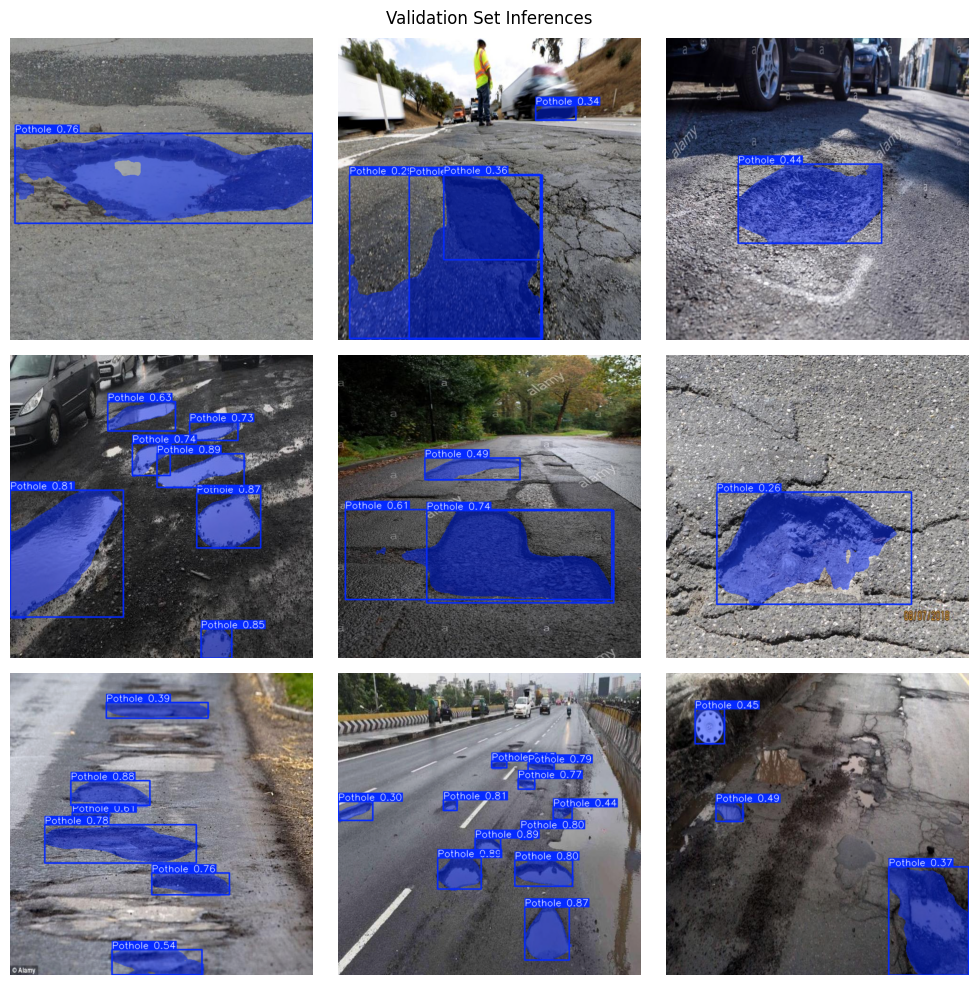

In [ ]:
validImagePath = os.path.join(dataDir, 'valid', 'images')

imageFiles = [f for f in os.listdir(validImagePath) if f.endswith('.jpg')]

numImages = len(imageFiles)
selectedImage = [imageFiles[i] for i in range(0, numImages, numImages // 9)]

fig, axes = plt.subplots(3, 3, figsize=(10, 10))
fig.suptitle('Validation Set Inferences')

for i, ax in enumerate(axes.flatten()):
  imagePath = os.path.join(validImagePath, selectedImage[i])
  results = bestModel.predict(source= imagePath, imgsz=640)
  annotatedImage = results[0].plot()
  annotatedImageRGB = cv2.cvtColor(annotatedImage, cv2.COLOR_BGR2RGB)
  ax.imshow(annotatedImageRGB)
  ax.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
import shutil
videoPath = '/content/drive/MyDrive/Pothole_Segmentation_YOLOv8/sample_video.mp4'

bestModel.predict(source=videoPath, save=True)



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/375) /content/drive/MyDrive/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 2 Potholes, 210.3ms
video 1/1 (frame 2/375) /content/drive/MyDrive/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 3 Potholes, 16.3ms


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:952: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv_transpose2d(


video 1/1 (frame 3/375) /content/drive/MyDrive/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 3 Potholes, 16.9ms
video 1/1 (frame 4/375) /content/drive/MyDrive/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 2 Potholes, 17.1ms
video 1/1 (frame 5/375) /content/drive/MyDrive/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 1 Pothole, 19.7ms
video 1/1 (frame 6/375) /content/drive/MyDrive/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 1 Pothole, 15.9ms
video 1/1 (frame 7/375) /content/drive/MyDrive/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 1 Pothole, 15.4ms
video 1/1 (frame 8/375) /content/drive/MyDrive/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 1 Pothole, 16.9ms
video 1/1 (frame 9/375) /content/drive/MyDrive/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 1 Pothole, 15.4ms
video 1/1 (frame 10/375) /content/drive/MyDrive/Pothole_Segmentation_YOLOv8/sample_video.mp4: 384x640 1 Pothole, 14.7ms
video 1/1 (frame 11/375) /content/drive/MyDri

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: ultralytics.engine.results.Masks object
 names: {0: 'Pothole'}
 obb: None
 orig_img: array([[[146, 137, 129],
         [177, 168, 160],
         [178, 169, 161],
         ...,
         [246, 243, 244],
         [246, 243, 244],
         [246, 243, 244]],
 
        [[197, 188, 180],
         [206, 197, 189],
         [164, 155, 147],
         ...,
         [246, 243, 244],
         [246, 243, 244],
         [246, 243, 244]],
 
        [[150, 141, 133],
         [183, 174, 166],
         [188, 179, 171],
         ...,
         [246, 243, 244],
         [246, 243, 244],
         [246, 243, 244]],
 
        ...,
 
        [[ 80,  92, 102],
         [ 70,  82,  92],
         [ 63,  75,  85],
         ...,
         [ 61,  81, 101],
         [ 62,  82, 102],
         [ 65,  85, 105]],
 
        [[ 70,  82,  92],
         [ 63,  75,  85],
         [ 59,  71,  8

In [ ]:
import subprocess

subprocess.call(['ffmpeg', '-y', '-loglevel', 'panic', '-i', '/content/runs/segment/predict/sample_video.avi', 'output_video.mp4'])

from IPython.display import Video

Video("output_video.mp4", embed=True, width=960)